This notebook will demonstrate that how we can use image prior contained in the structure of the network and train the network on that single image to get closest to the original image.

In [2]:
from __future__ import print_function
%matplotlib inline 

import os
import numpy as np
from models import *

# os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import torch
import torch.optim

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

# from skimage.measure import peak_signal_noise_ratio
from skimage.metrics import peak_signal_noise_ratio
from denoising_utility import *

In [3]:
pip install -U pip

     |████████████████████████████████| 2.1 MB 5.3 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3


In [4]:
pip install -U scikit-image

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 67.4 MB/s eta 0:00:00
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.18.3
    Uninstalling scikit-image-0.18.3:
      Successfully uninstalled scikit-image-0.18.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [5]:
imsize =-1
PLOT = True
sigma = 50
sigma_ = sigma/255.

In [6]:
img_path = 'data/Lenna_noisy.png'

## Loading Image

Original Image: 


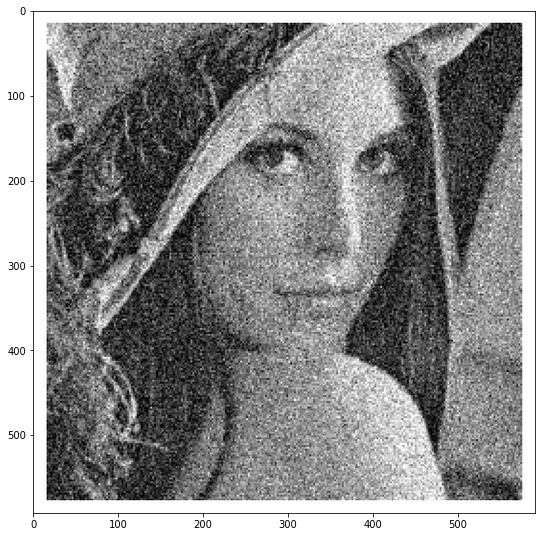


Noised Image: 


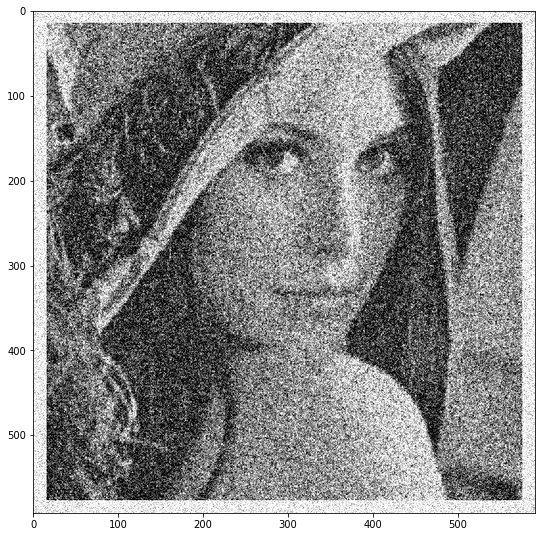

In [7]:
img_pil = crop_image(get_image(img_path, imsize)[0], d=16)
img_np = pil_to_np(img_pil) # converting PIL image to np array
#print(img_noisy_np.shape)
img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_) #adding noise to the original image
if PLOT:
  print('Original Image: ')
  plot_image_grid([img_np], 1, 8);
  print('\nNoised Image: ')
  plot_image_grid([img_noisy_np], 1, 8);


## Training

In [8]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./20. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 2500
input_depth = 1
figsize = 8

# creates a convolutional network with skip connections
net = get_net(input_depth, 'skip', pad, n_channels=1, 
              num_scales=5, upsample_mode='bilinear').type(dtype)


# get initial noised image (random) from which the network will try and build up output image
# denoted as z in the paper
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 

print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype) # converting np array to torch tensor

Number of params: 2181737


Starting optimization with ADAM


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)




After 0 iterations: 
Iteration 00000    Loss 0.095477   PSNR_noisy: 10.201007   PSRN_gt: 11.070847   PSNR_gt_sm: 11.070847 


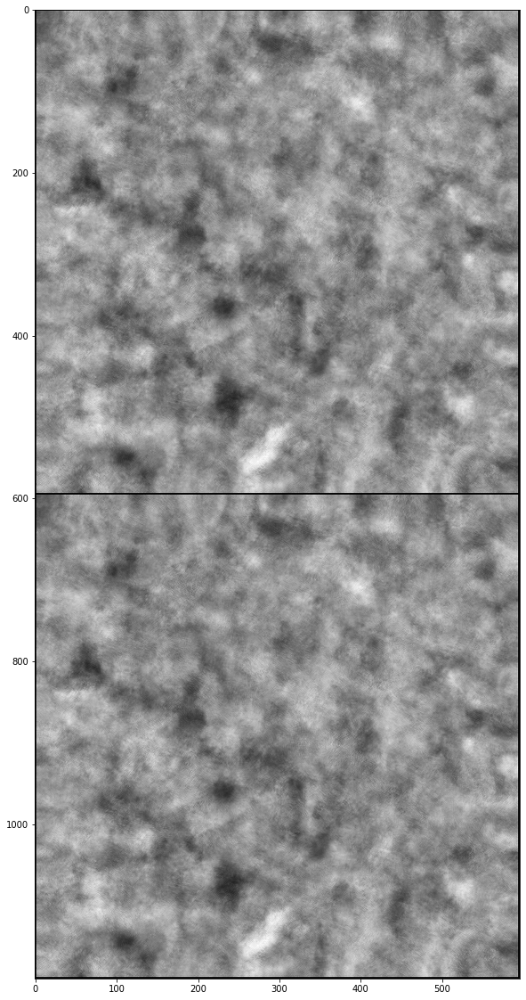



After 100 iterations: 
Iteration 00100    Loss 0.063270   PSNR_noisy: 11.988016   PSRN_gt: 13.948317   PSNR_gt_sm: 12.871958 


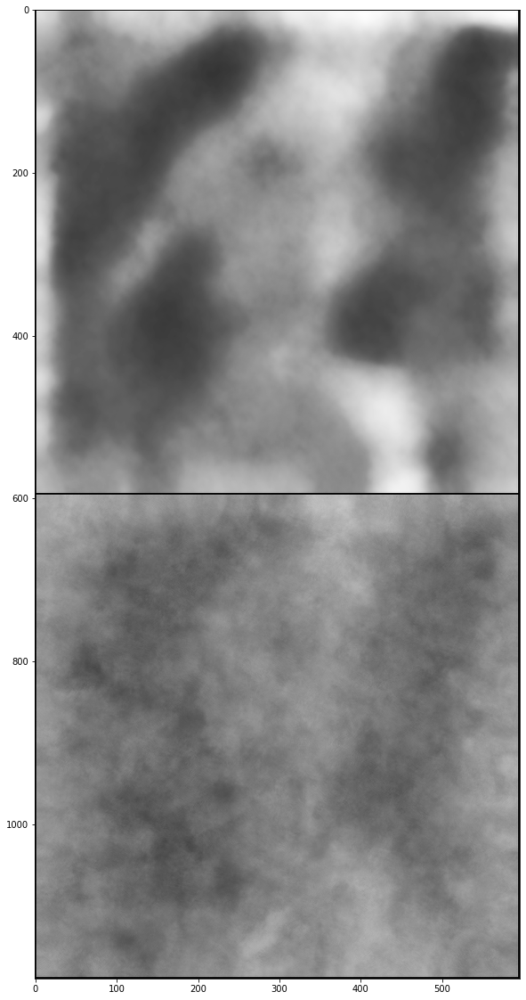



After 200 iterations: 
Iteration 00200    Loss 0.048490   PSNR_noisy: 13.143448   PSRN_gt: 16.714720   PSNR_gt_sm: 15.268825 


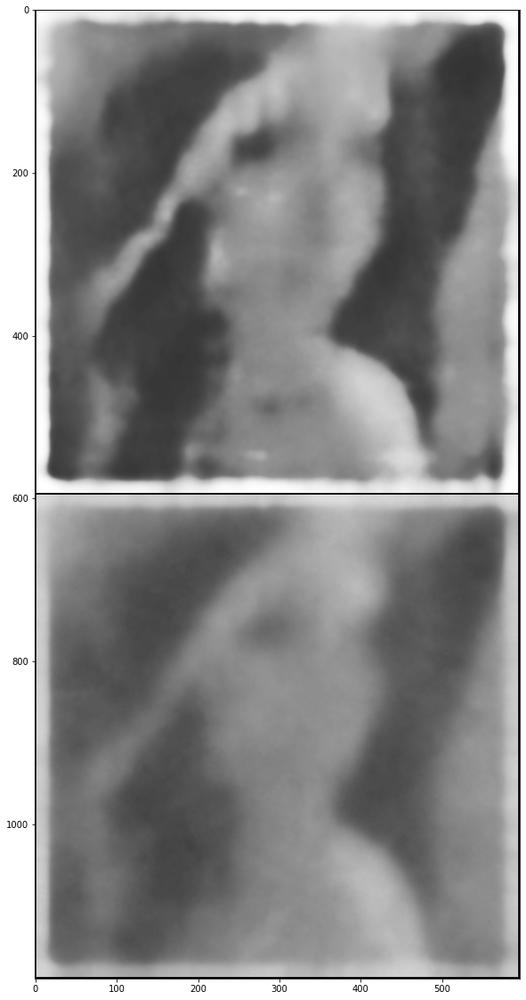



After 300 iterations: 
Iteration 00300    Loss 0.046177   PSNR_noisy: 13.355748   PSRN_gt: 17.239158   PSNR_gt_sm: 16.850903 


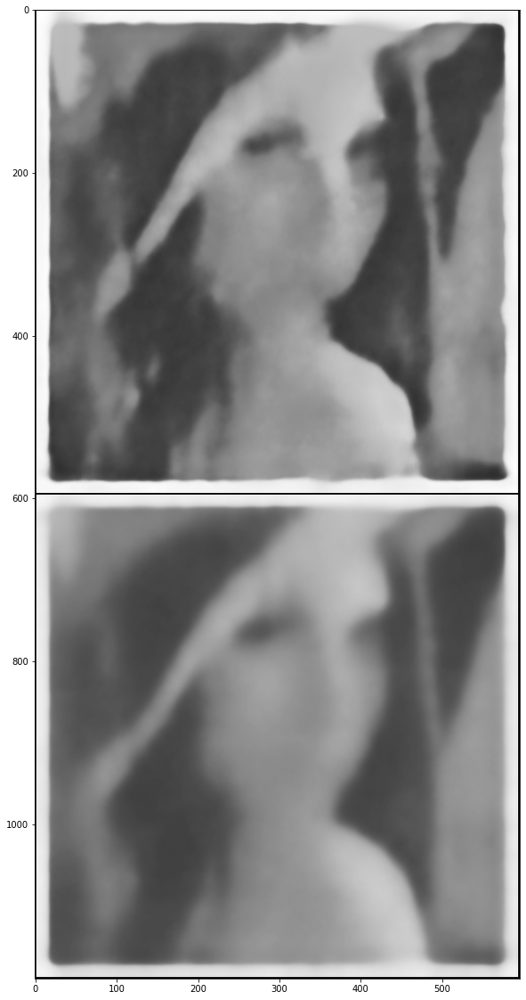



After 400 iterations: 
Iteration 00400    Loss 0.043884   PSNR_noisy: 13.576923   PSRN_gt: 17.895140   PSNR_gt_sm: 17.728680 


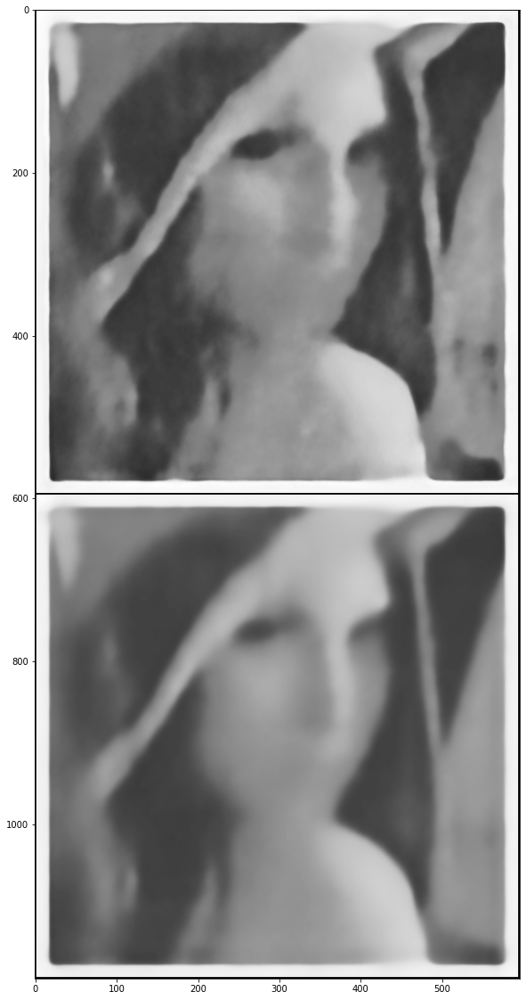



After 500 iterations: 
Iteration 00500    Loss 0.042810   PSNR_noisy: 13.684545   PSRN_gt: 18.182054   PSNR_gt_sm: 18.236349 


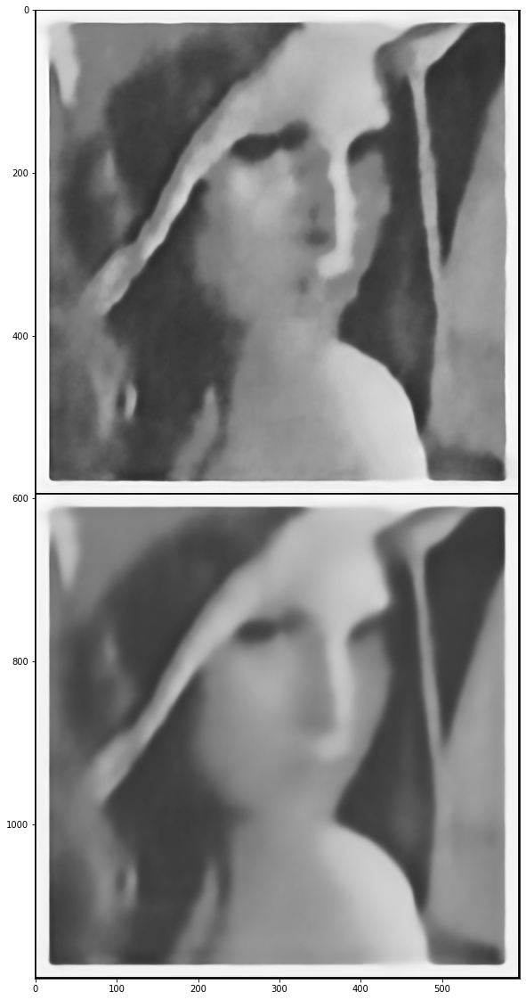



After 600 iterations: 
Iteration 00600    Loss 0.042061   PSNR_noisy: 13.761164   PSRN_gt: 18.454284   PSNR_gt_sm: 18.539016 


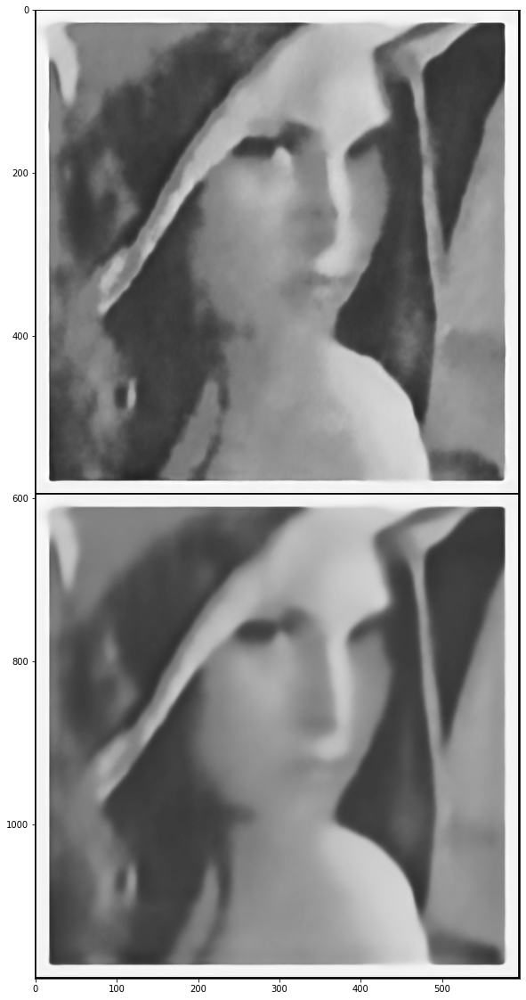



After 700 iterations: 
Iteration 00700    Loss 0.041356   PSNR_noisy: 13.834619   PSRN_gt: 18.664927   PSNR_gt_sm: 18.747765 


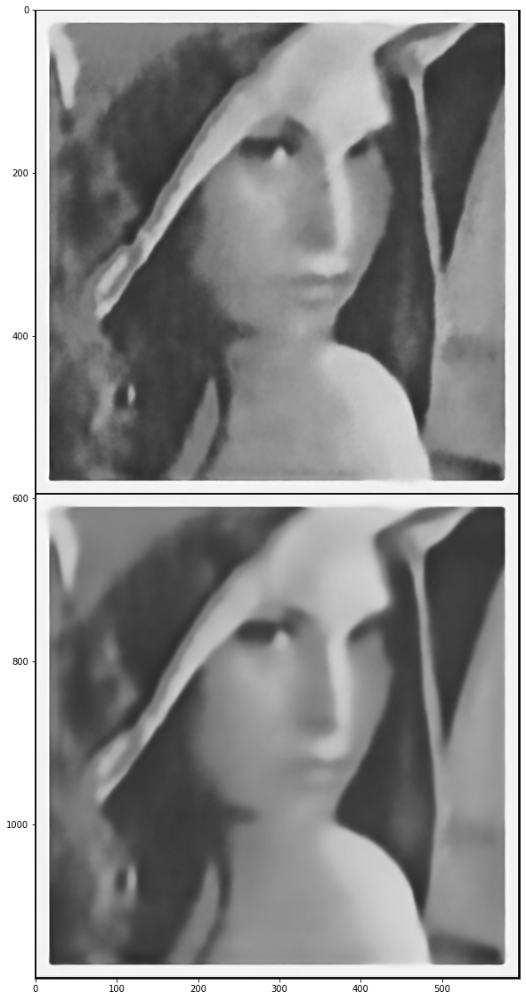



After 800 iterations: 
Iteration 00800    Loss 0.041134   PSNR_noisy: 13.857967   PSRN_gt: 18.837875   PSNR_gt_sm: 18.902295 


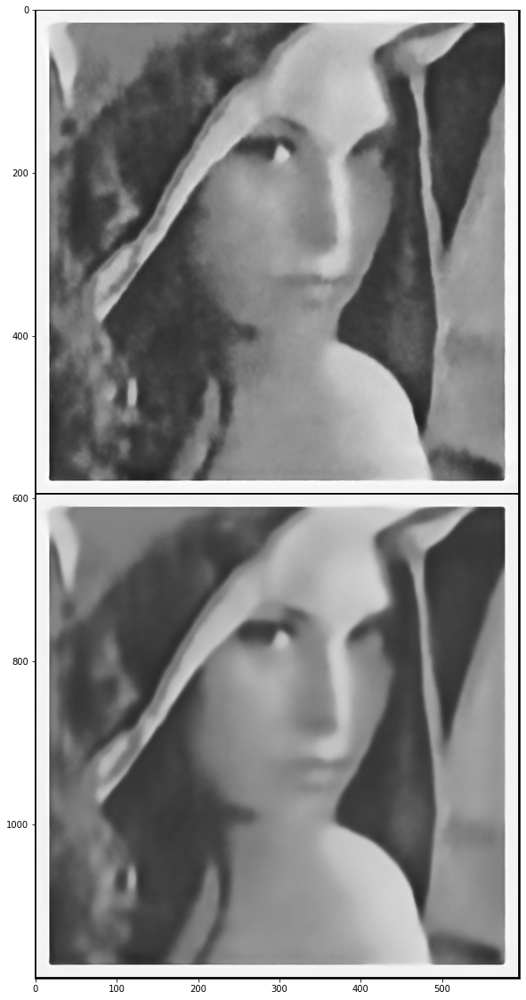



After 900 iterations: 
Iteration 00900    Loss 0.040844   PSNR_noisy: 13.888690   PSRN_gt: 18.850143   PSNR_gt_sm: 19.025608 


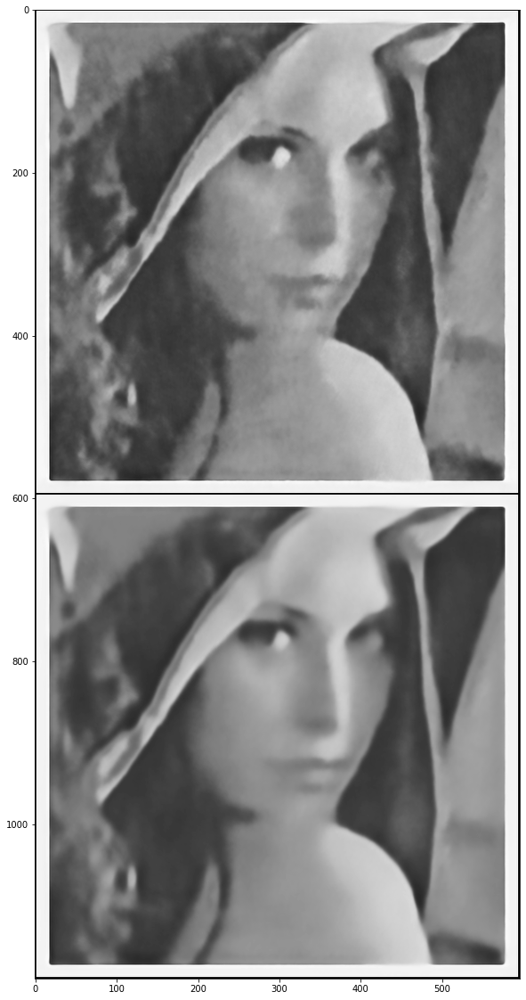



After 1000 iterations: 
Iteration 01000    Loss 0.040543   PSNR_noisy: 13.920848   PSRN_gt: 18.998193   PSNR_gt_sm: 19.133369 


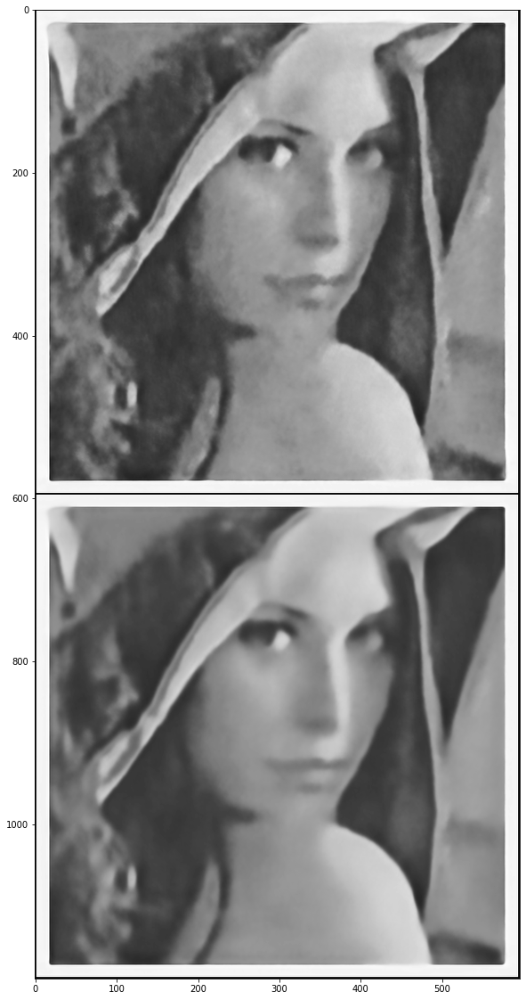



After 1100 iterations: 
Iteration 01100    Loss 0.040248   PSNR_noisy: 13.952595   PSRN_gt: 19.069806   PSNR_gt_sm: 19.232923 


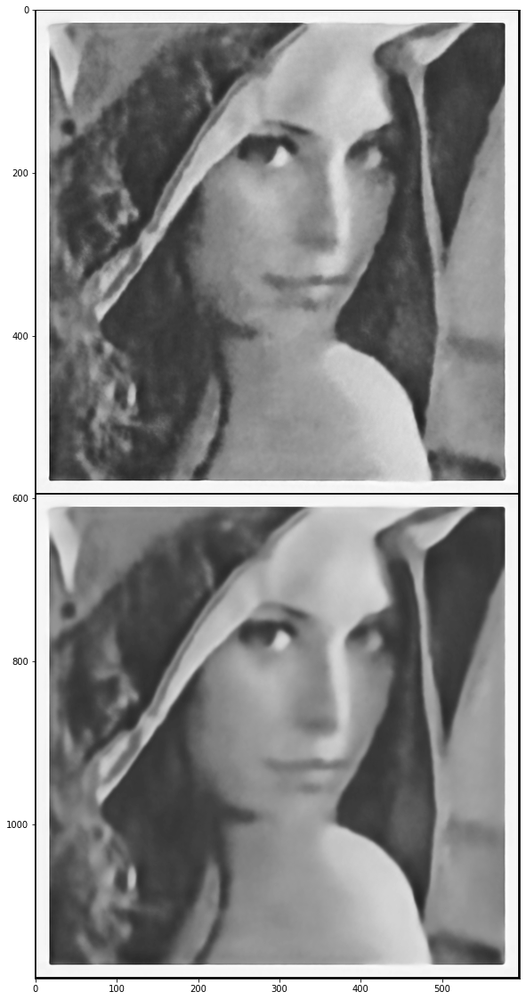



After 1200 iterations: 
Iteration 01200    Loss 0.039910   PSNR_noisy: 13.989141   PSRN_gt: 19.207620   PSNR_gt_sm: 19.322624 


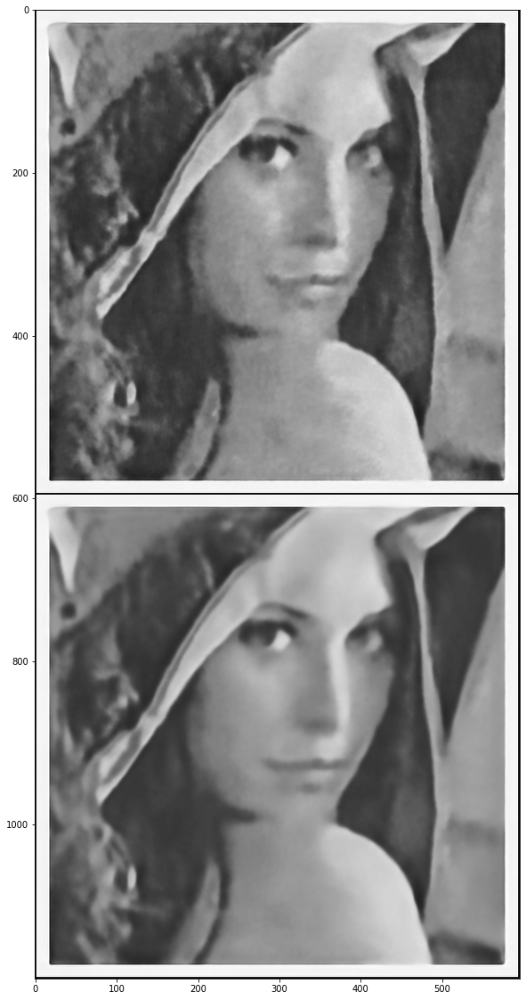



After 1300 iterations: 
Iteration 01300    Loss 0.039669   PSNR_noisy: 14.015498   PSRN_gt: 19.227195   PSNR_gt_sm: 19.404717 


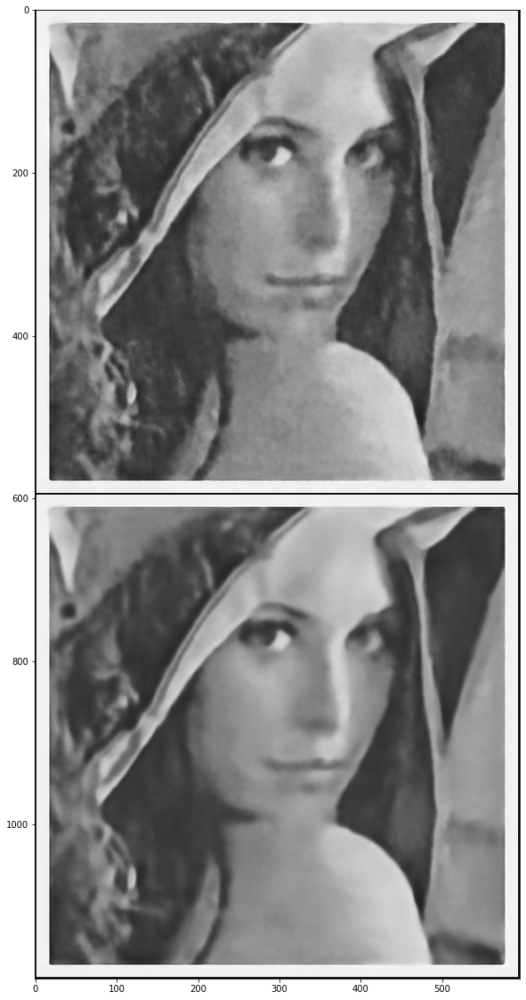



After 1400 iterations: 
Iteration 01400    Loss 0.039512   PSNR_noisy: 14.032732   PSRN_gt: 19.288815   PSNR_gt_sm: 19.482165 


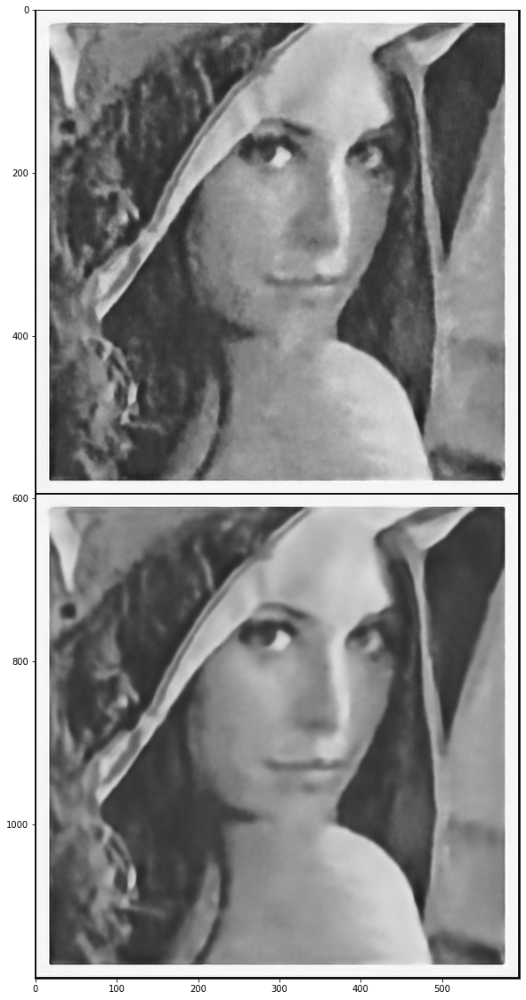



After 1500 iterations: 
Iteration 01500    Loss 0.039338   PSNR_noisy: 14.051911   PSRN_gt: 19.379828   PSNR_gt_sm: 19.554321 


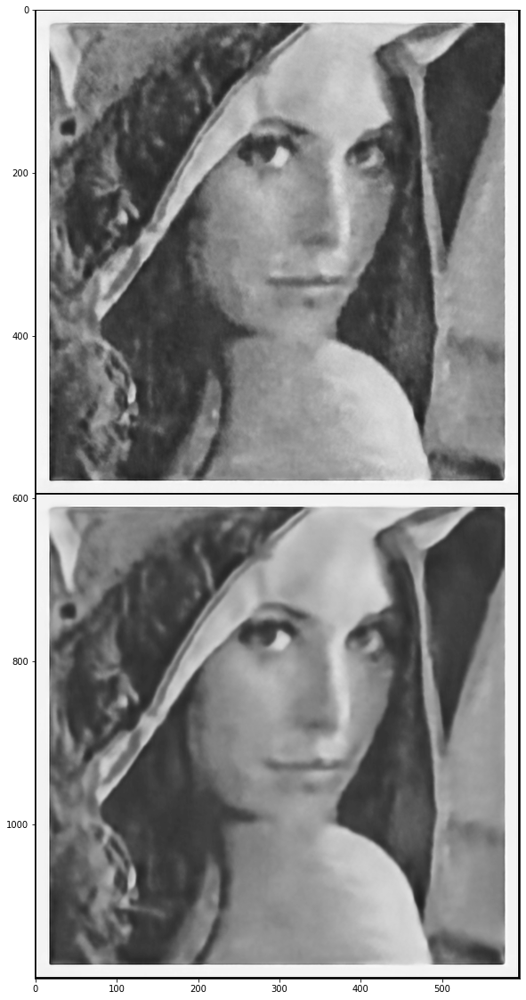



After 1600 iterations: 
Iteration 01600    Loss 0.039113   PSNR_noisy: 14.076809   PSRN_gt: 19.438254   PSNR_gt_sm: 19.630684 


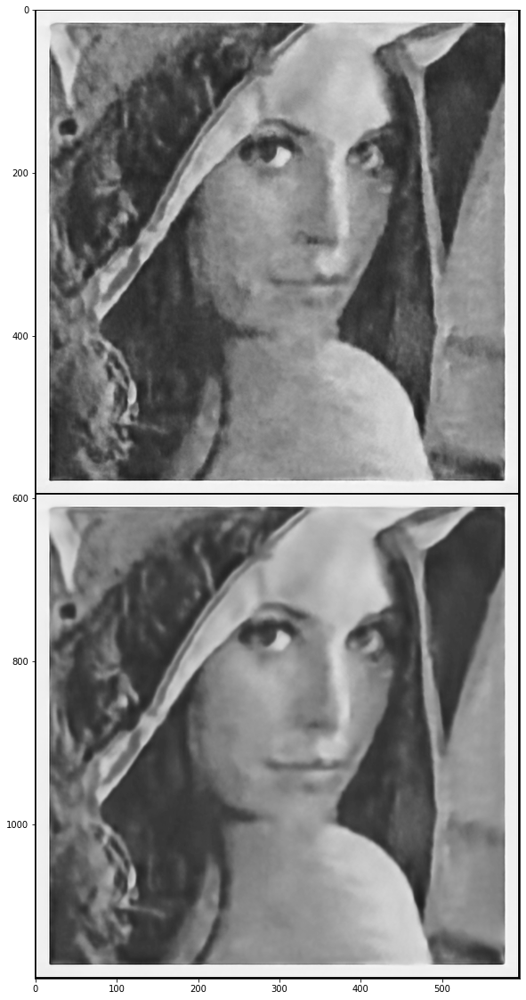



After 1700 iterations: 
Iteration 01700    Loss 0.038785   PSNR_noisy: 14.113317   PSRN_gt: 19.515381   PSNR_gt_sm: 19.710077 


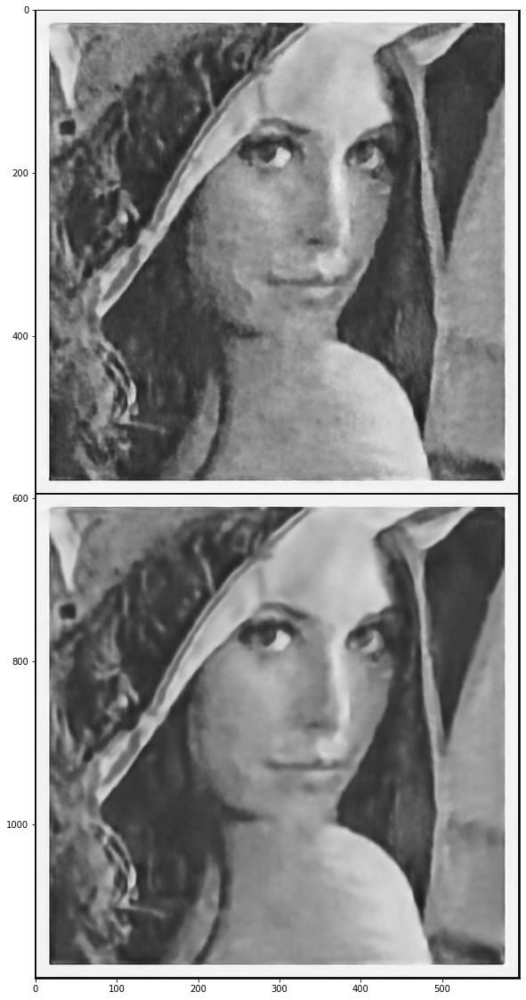



After 1800 iterations: 
Iteration 01800    Loss 0.038523   PSNR_noisy: 14.142755   PSRN_gt: 19.630122   PSNR_gt_sm: 19.793535 


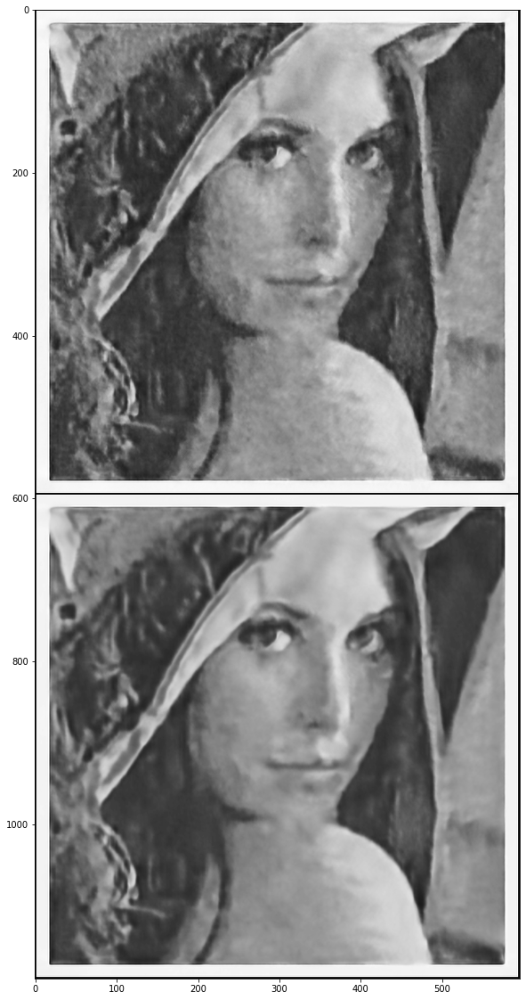



After 1900 iterations: 
Iteration 01900    Loss 0.038251   PSNR_noisy: 14.173571   PSRN_gt: 19.505055   PSNR_gt_sm: 19.878860 


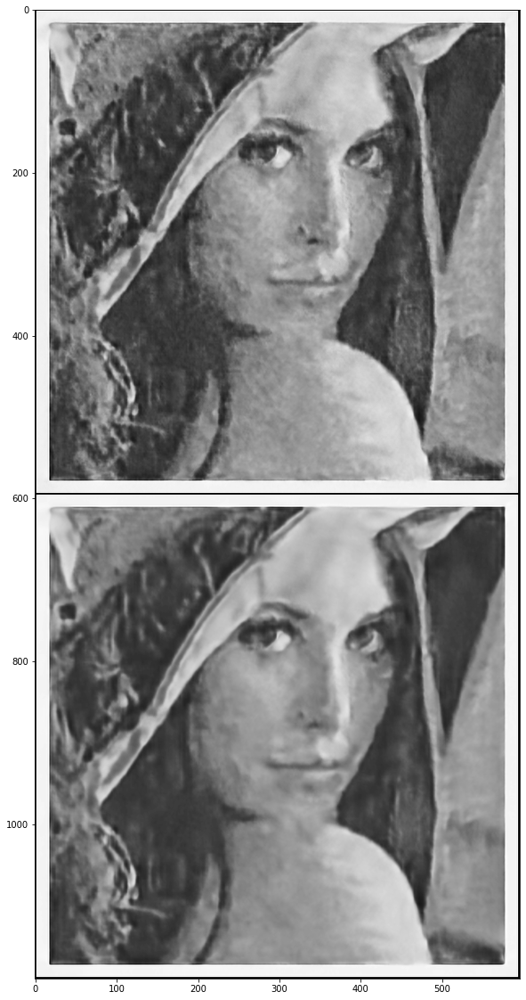



After 2000 iterations: 
Iteration 02000    Loss 0.037815   PSNR_noisy: 14.223414   PSRN_gt: 19.648967   PSNR_gt_sm: 19.967156 


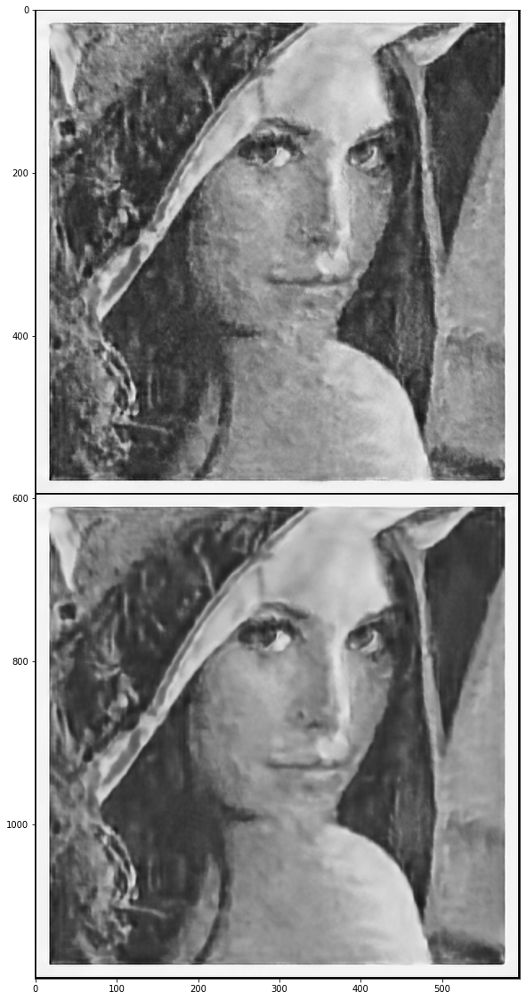



After 2100 iterations: 
Iteration 02100    Loss 0.037460   PSNR_noisy: 14.264312   PSRN_gt: 19.693674   PSNR_gt_sm: 20.064076 


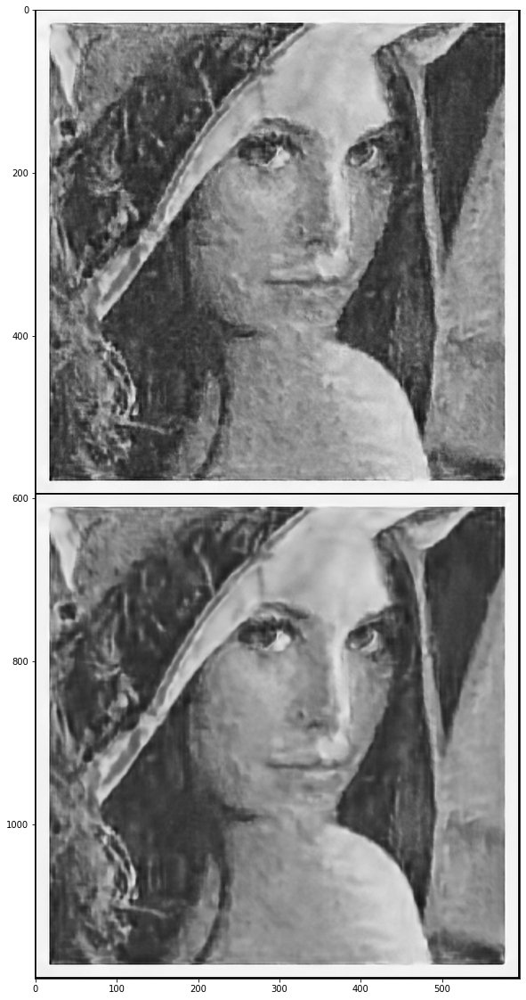



After 2200 iterations: 
Iteration 02200    Loss 0.036953   PSNR_noisy: 14.323449   PSRN_gt: 19.797568   PSNR_gt_sm: 20.167059 


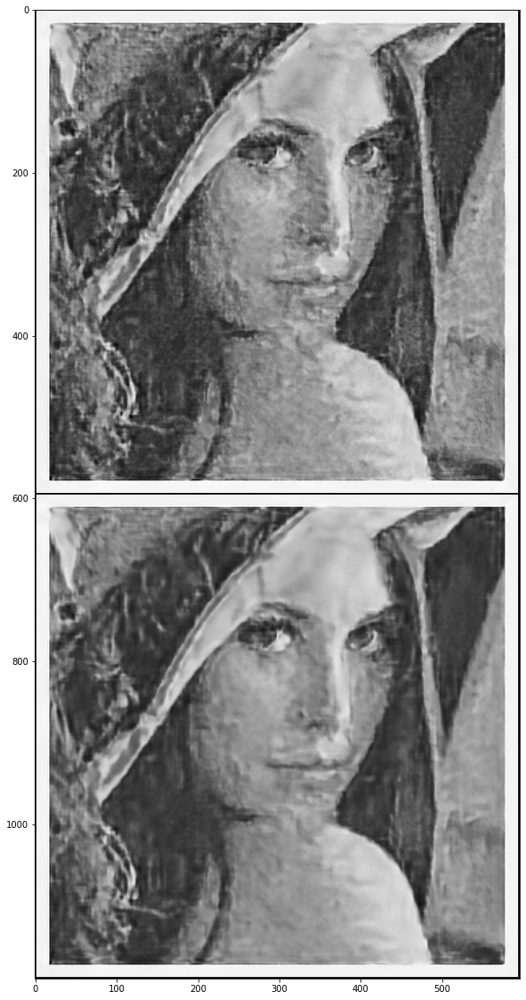



After 2300 iterations: 
Iteration 02300    Loss 0.036414   PSNR_noisy: 14.387370   PSRN_gt: 19.862971   PSNR_gt_sm: 20.278305 


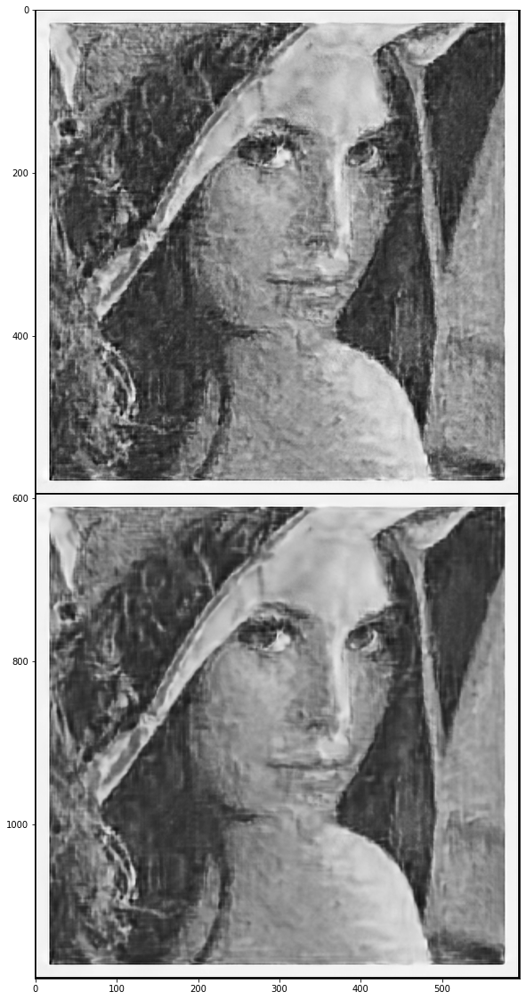



After 2400 iterations: 
Iteration 02400    Loss 0.035791   PSNR_noisy: 14.462312   PSRN_gt: 19.888534   PSNR_gt_sm: 20.397794 


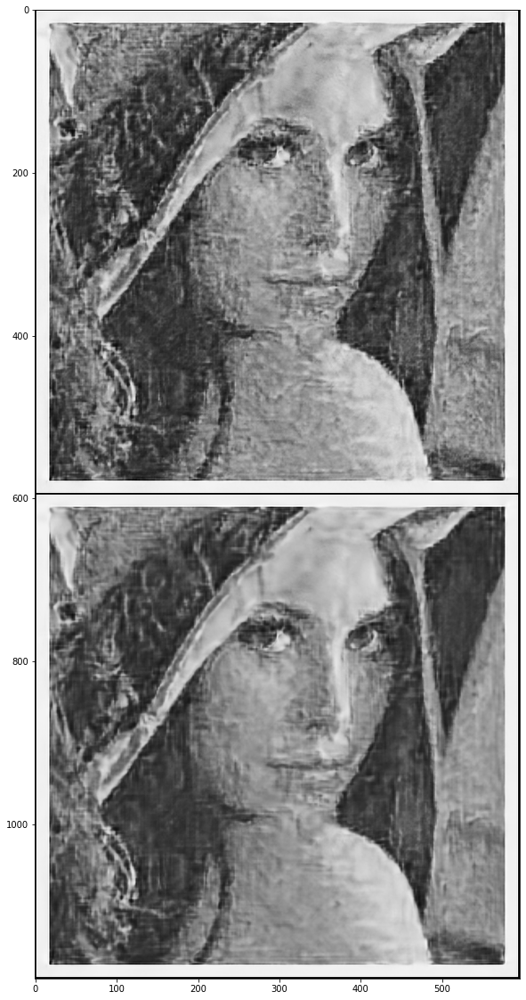

In [9]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0
loss = []
psnr_output = []

i = 0
def optimization_fun():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input, loss
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std) #changing the input to the netwok
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight) # calculating average network output
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()

    loss.append(total_loss.item())
    psnr_output.append(peak_signal_noise_ratio(image_test=out.detach().cpu().numpy()[0], image_true=img_np))
        
    
    # caculating psrn
    psrn_noisy = peak_signal_noise_ratio(img_noisy_np, out.detach().cpu().numpy()[0]) # comparing psnr for the output image and the actual noisy image 
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0]) # comparing psnr for the output image and the original image 
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0]) # comparing psnr for the output average and the original image 
    
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        # plotting the output image along the average image calculated
        print(f'\n\nAfter {i} iterations: ')
        print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f   PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='\n')
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        
        
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, optimization_fun, LR, num_iter)

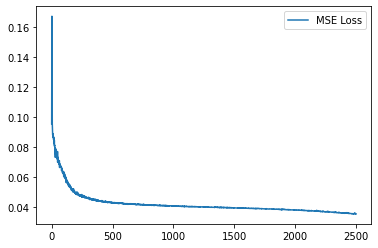

In [11]:
# Plotting the loss and psnr of output image as a function of number of iterations for previous training excersize
itr = [i for i in range(num_iter)]
# fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=1) # two axes on figure

plt.plot(itr, loss)
plt.legend(['MSE Loss'])
plt.show()

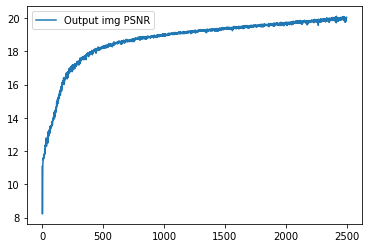

In [13]:
plt.plot(itr, psnr_output)
plt.legend(['Output img PSNR']) # output image psnr compared to ground truth

plt.show()

We don't want the network to overfit the noised image and the mse loss to be so small that's we stop pretty early.

## Output

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


Output Image from the network: 


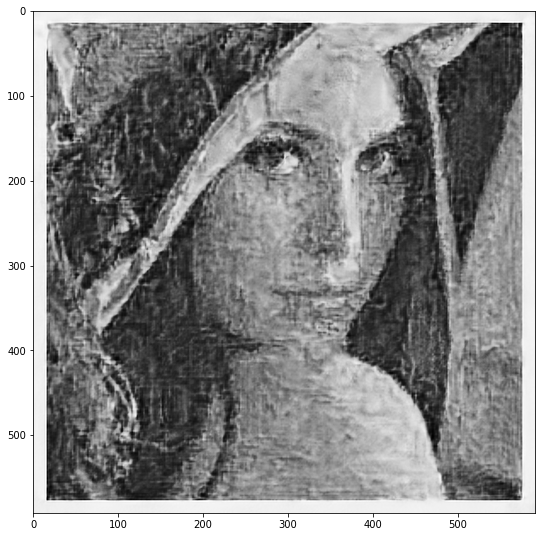


Noised Image: 


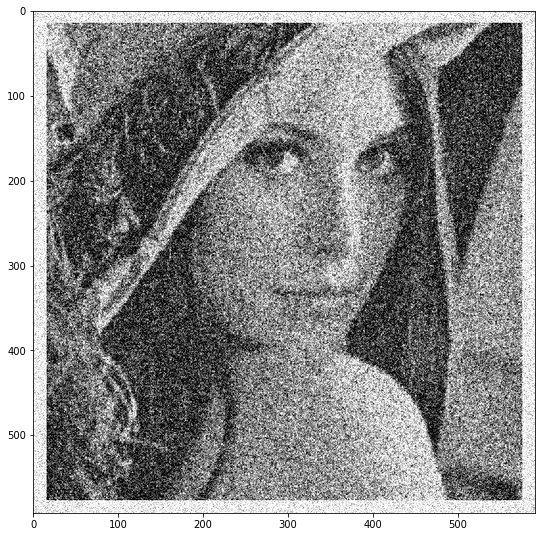


Original Image: 


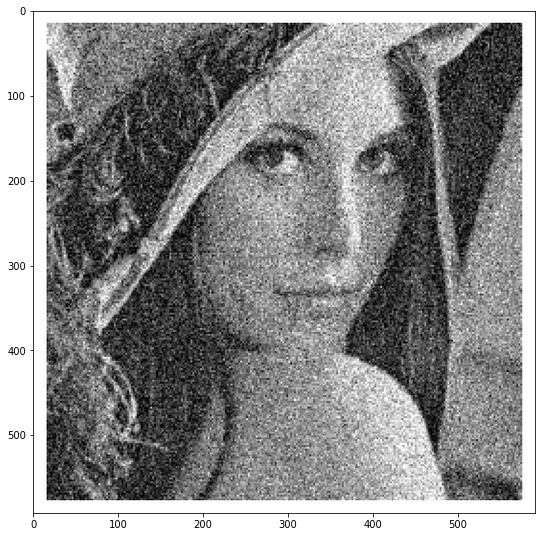

In [14]:
out_np = torch_to_np(net(net_input))

print('Output Image from the network: ')
plot_image_grid([np.clip(out_np, 0, 1)], factor=8);

print('\nNoised Image: ')
plot_image_grid([img_noisy_np], factor=8);

print('\nOriginal Image: ')
plot_image_grid([img_np], factor=8);